In [21]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import recall_score, precision_score, f1_score

In [5]:
df = pd.read_csv('../data/breast-cancer-kaggle.csv')

In [6]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [8]:
df.drop(columns=['Unnamed: 32', 'id'], inplace=True)

In [9]:
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


## EDA

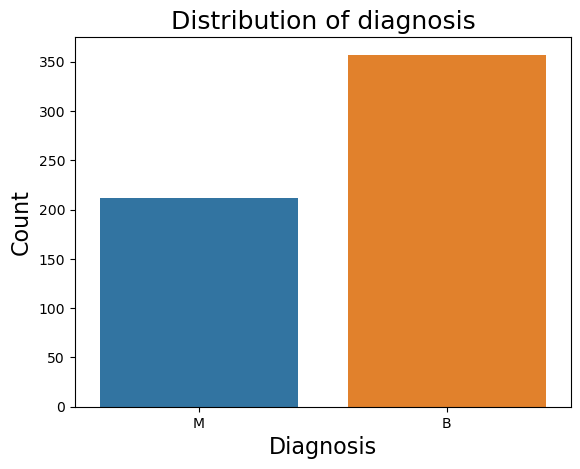

In [11]:
sns.countplot(x="diagnosis", data=df);
plt.title('Distribution of diagnosis', fontsize=18);
plt.xlabel('Diagnosis', fontsize=16);
plt.ylabel('Count', fontsize=16);

In [12]:
numeric_features = df.select_dtypes(include=[np.number]).columns.tolist()
print(numeric_features)

['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


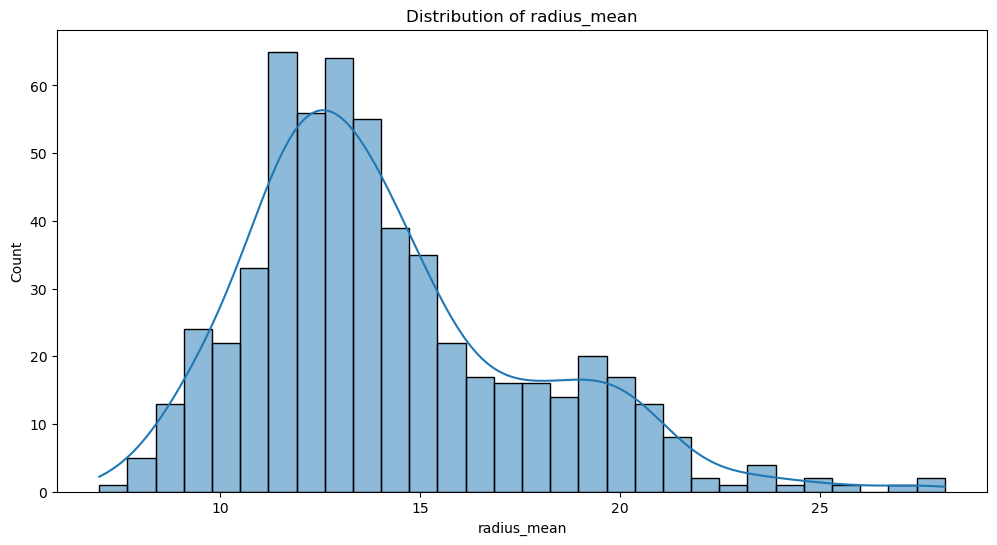

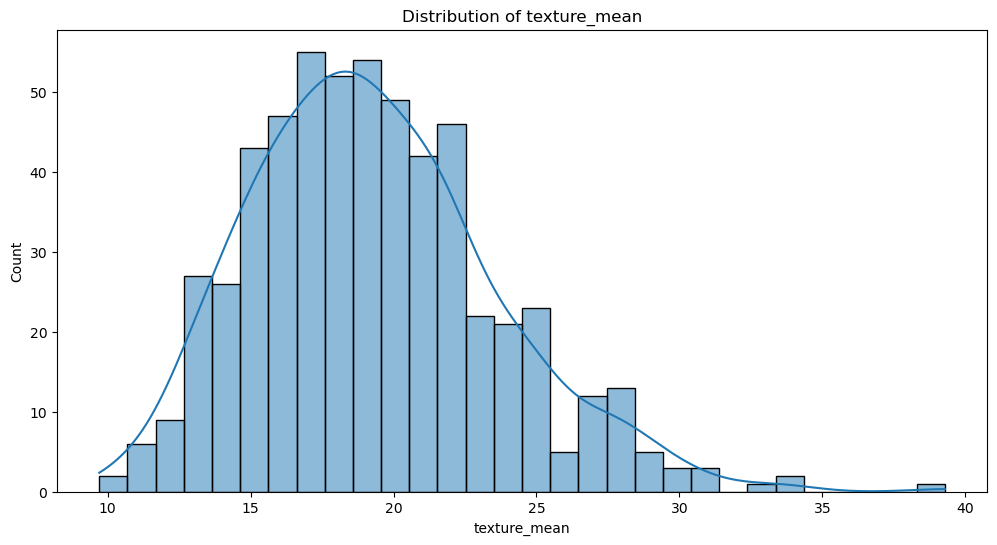

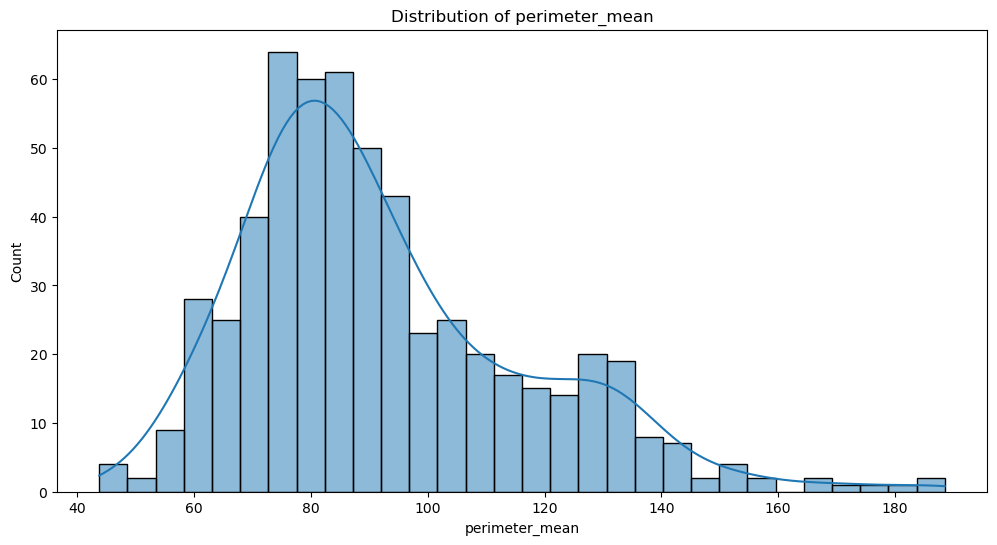

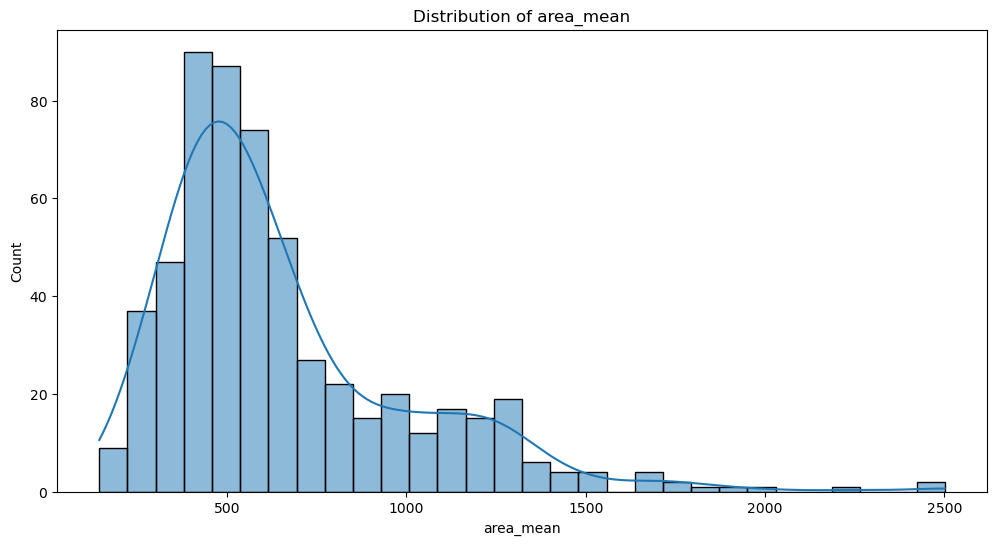

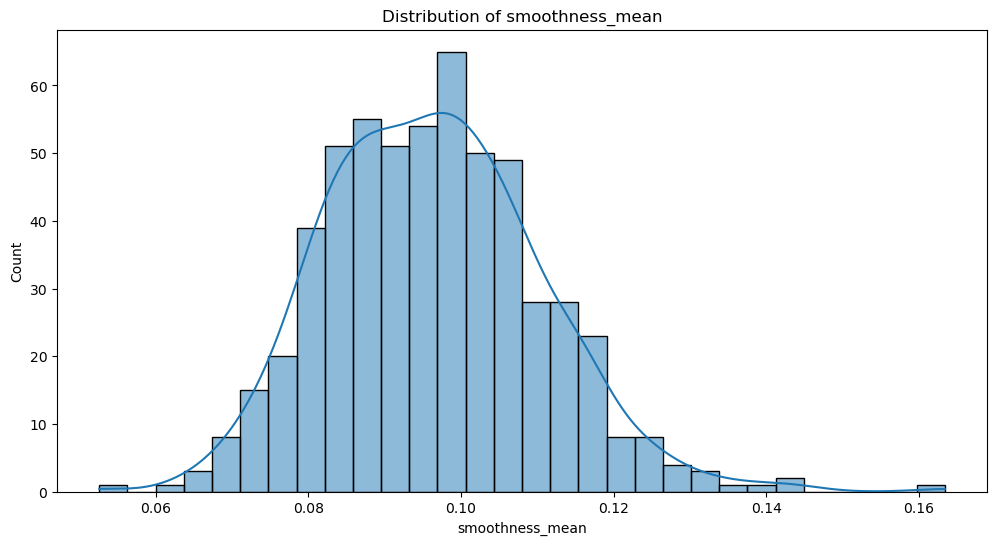

...

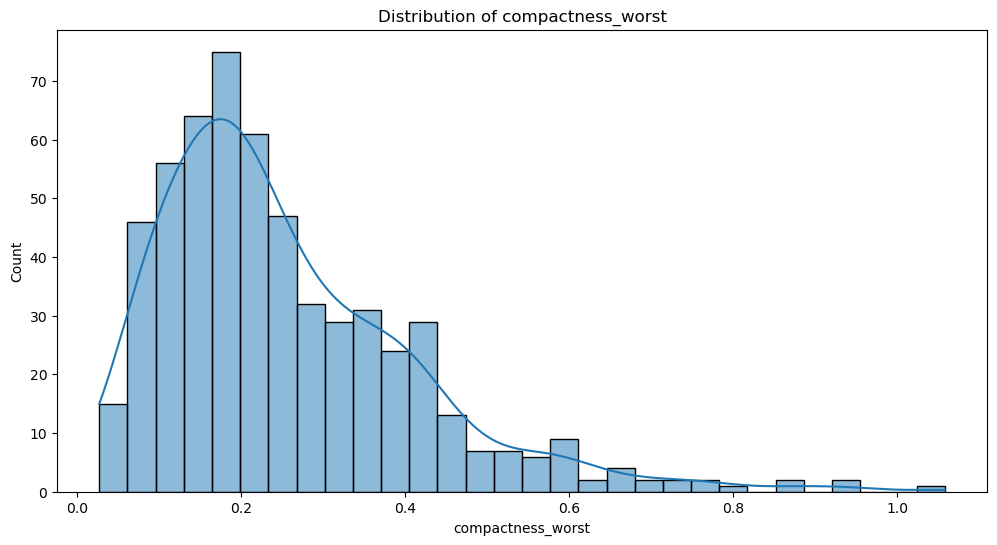

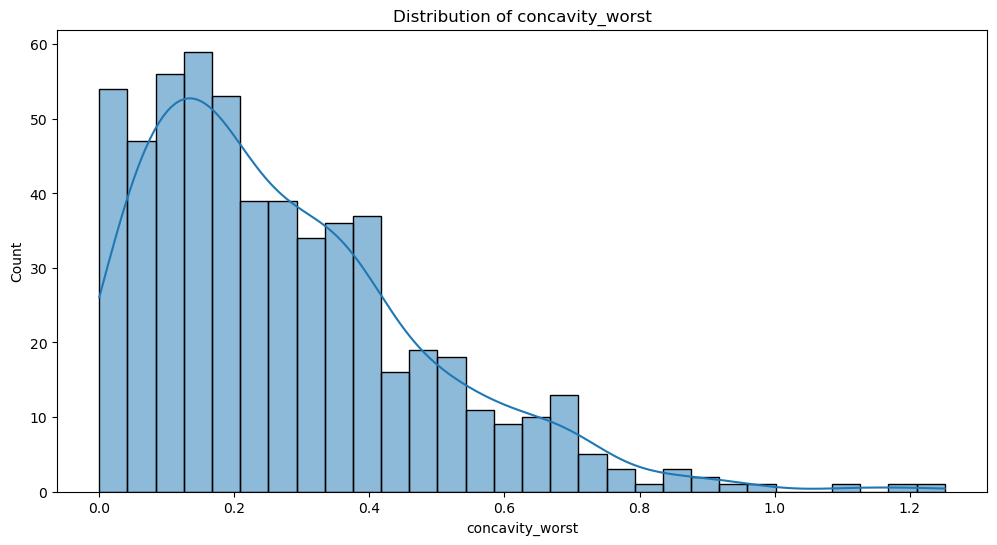

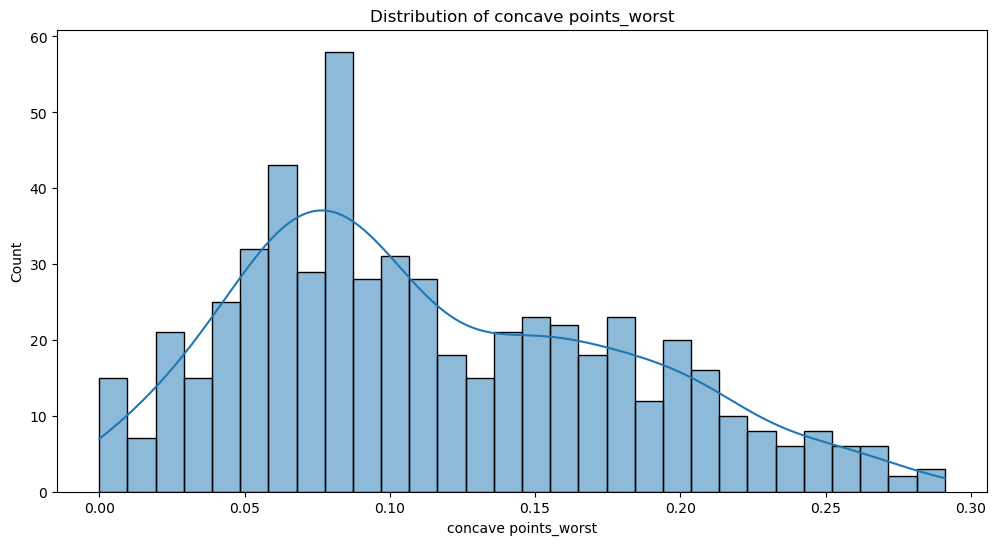

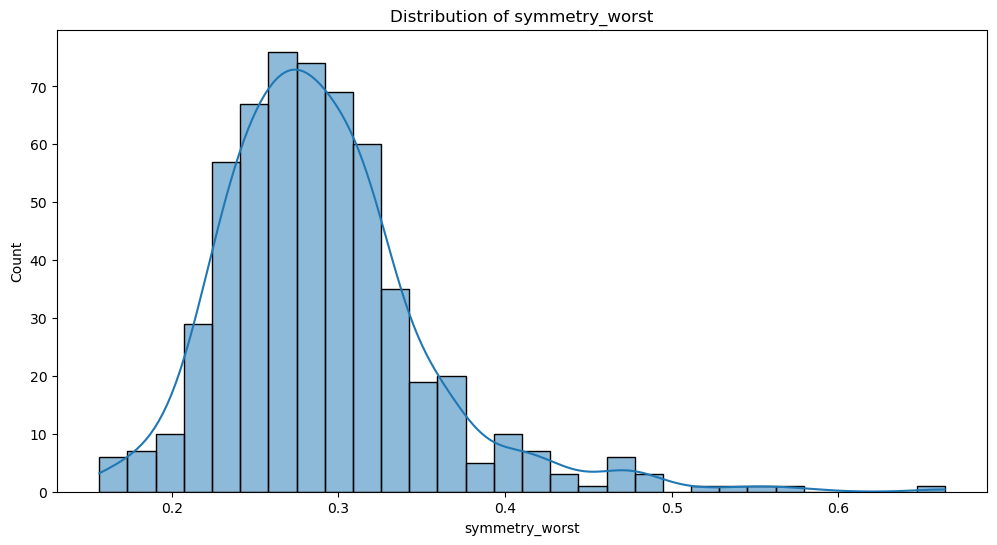

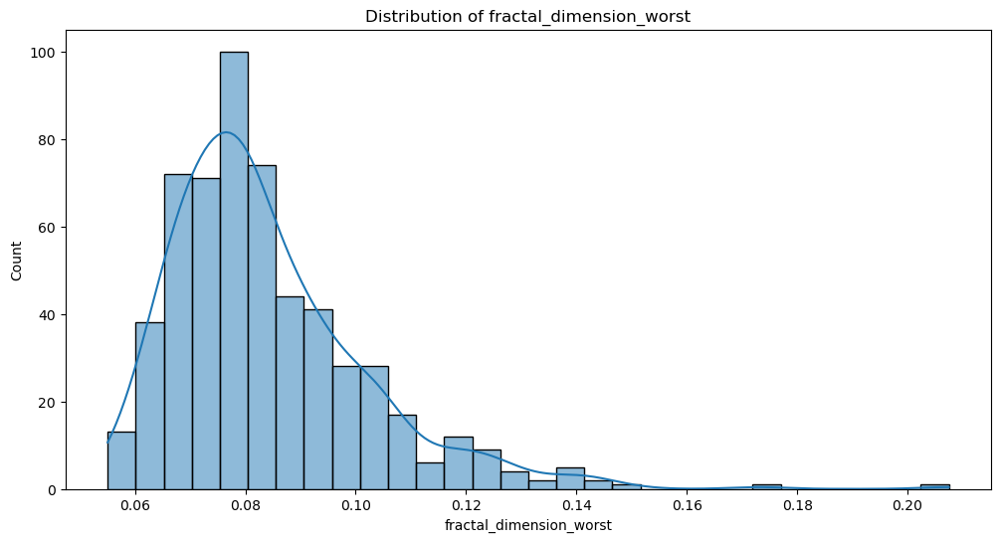

In [13]:
for col in numeric_features:
    plt.figure(figsize=(12, 6))
    sns.histplot(data=df, x=col, kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.show()

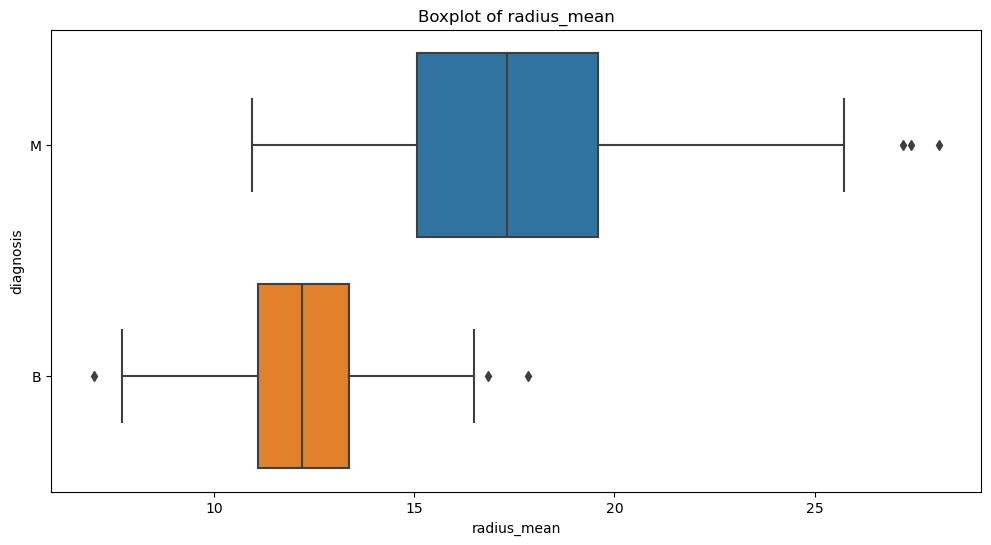

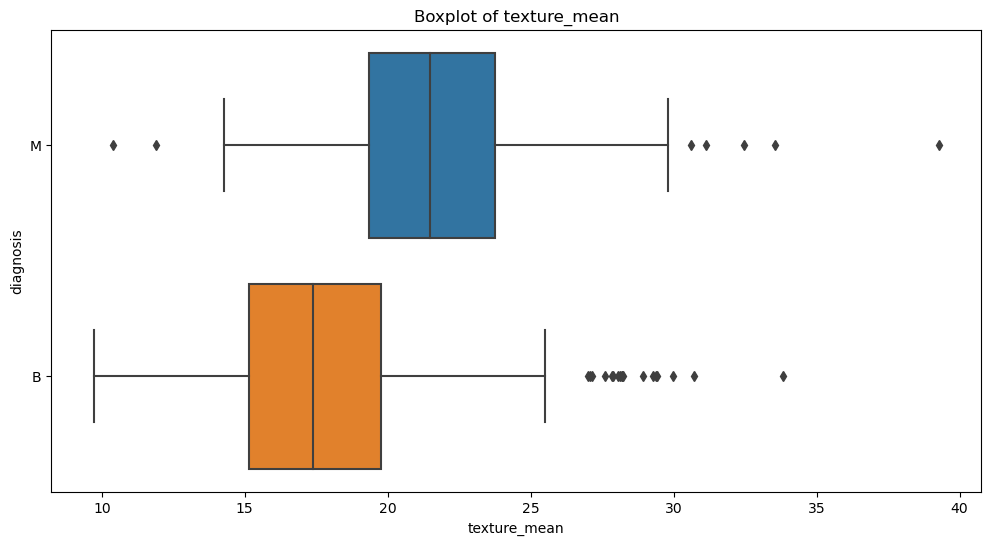

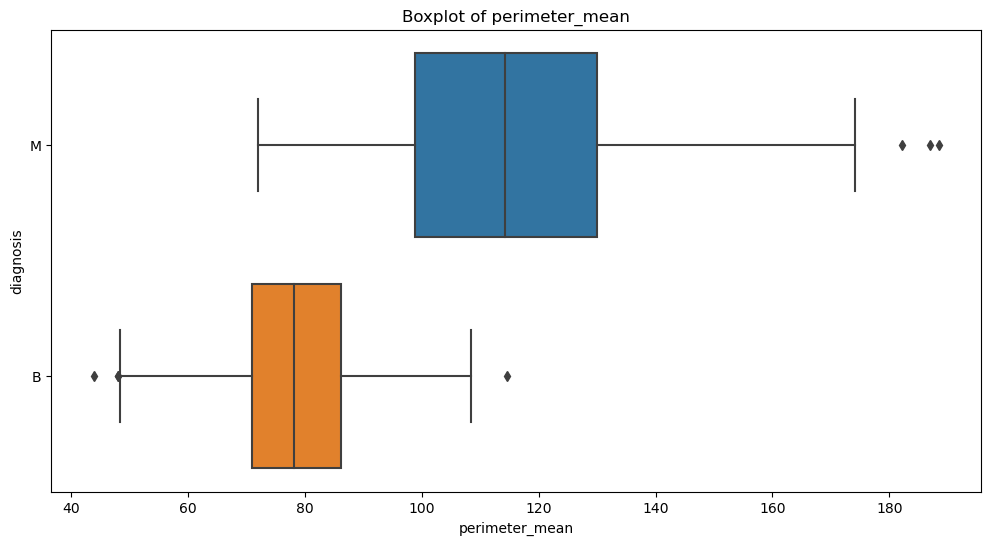

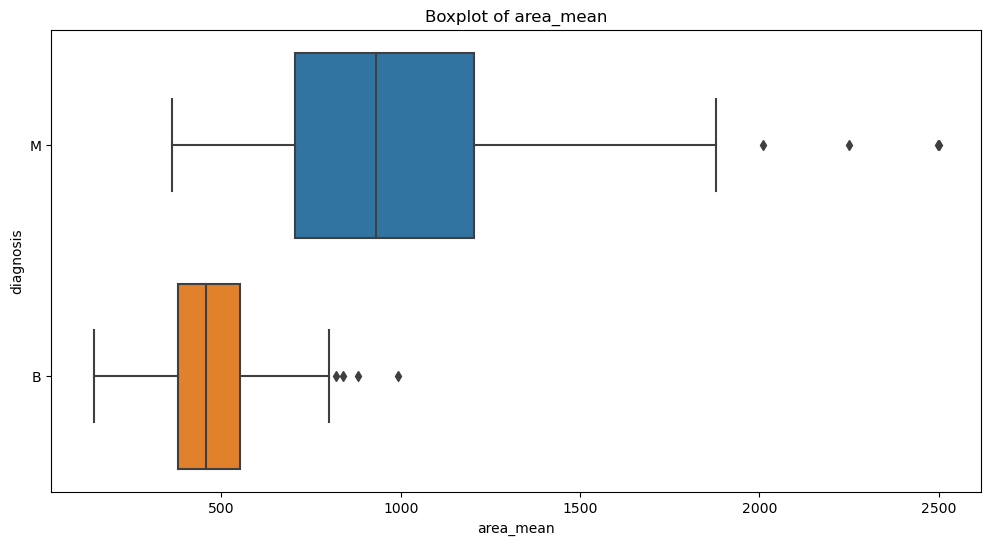

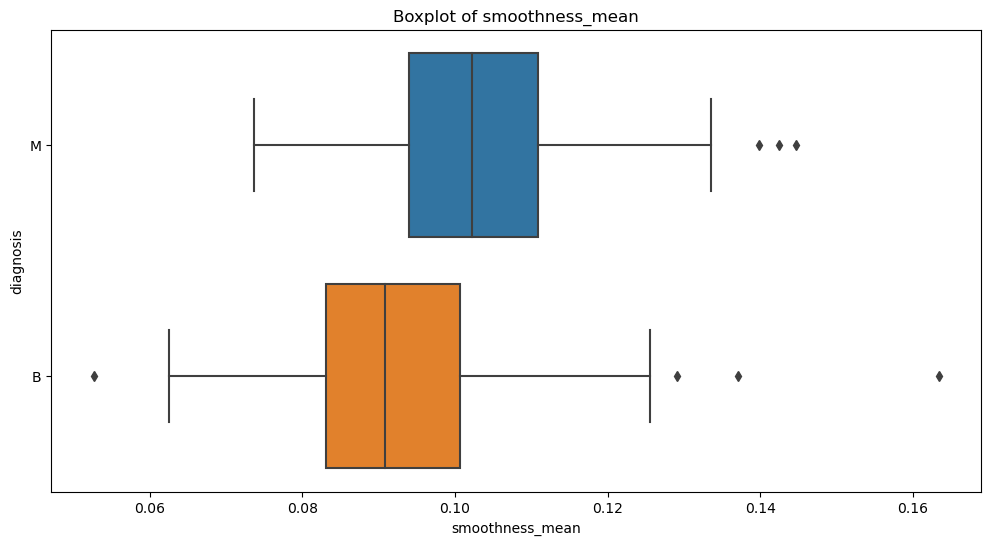

...

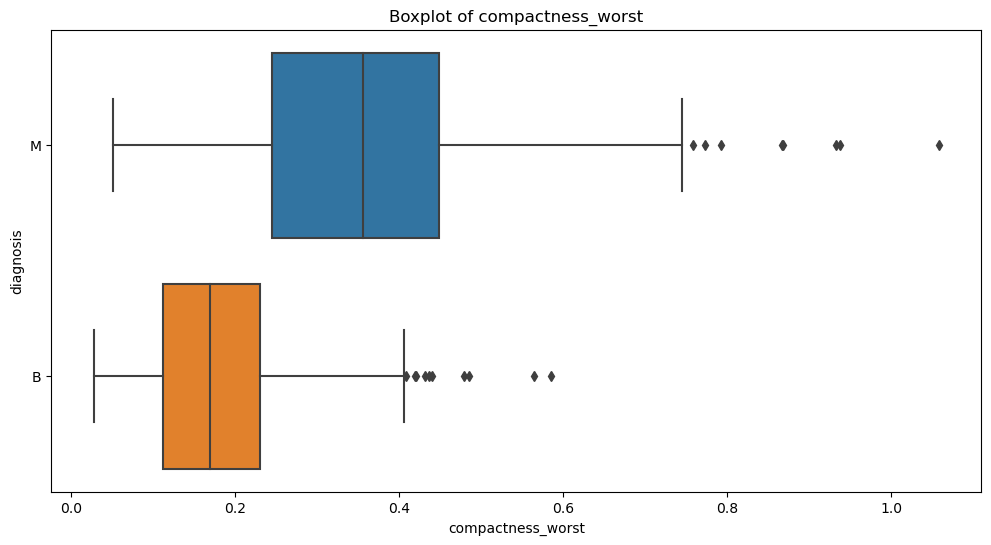

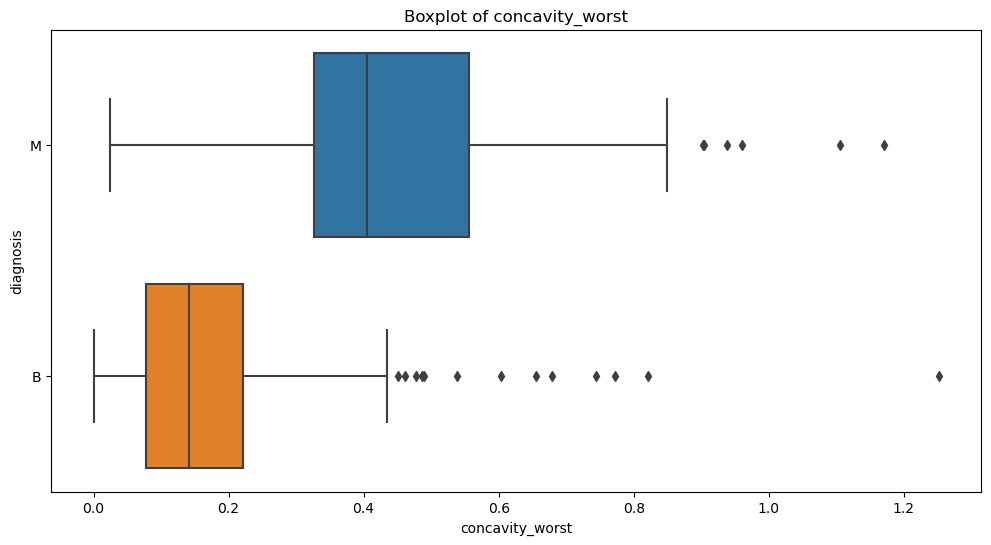

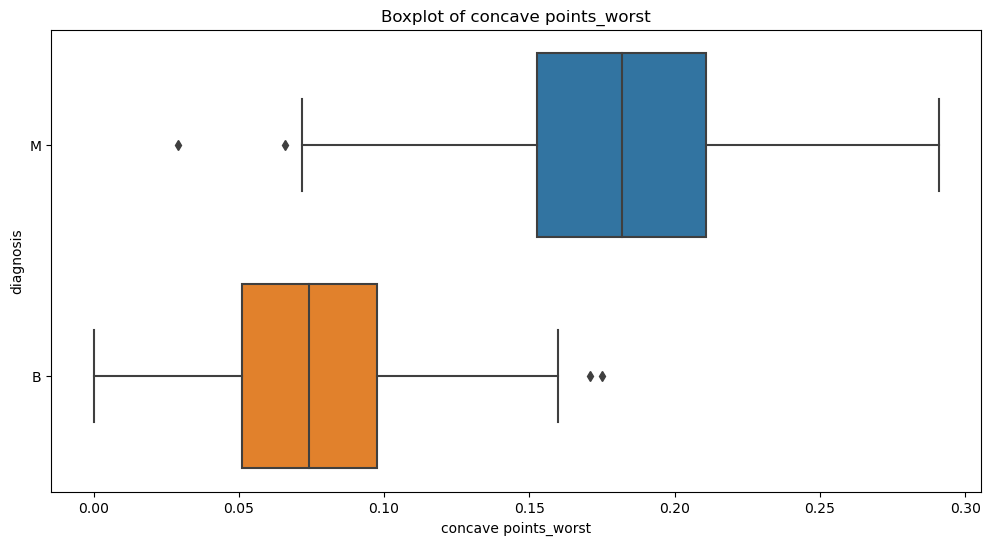

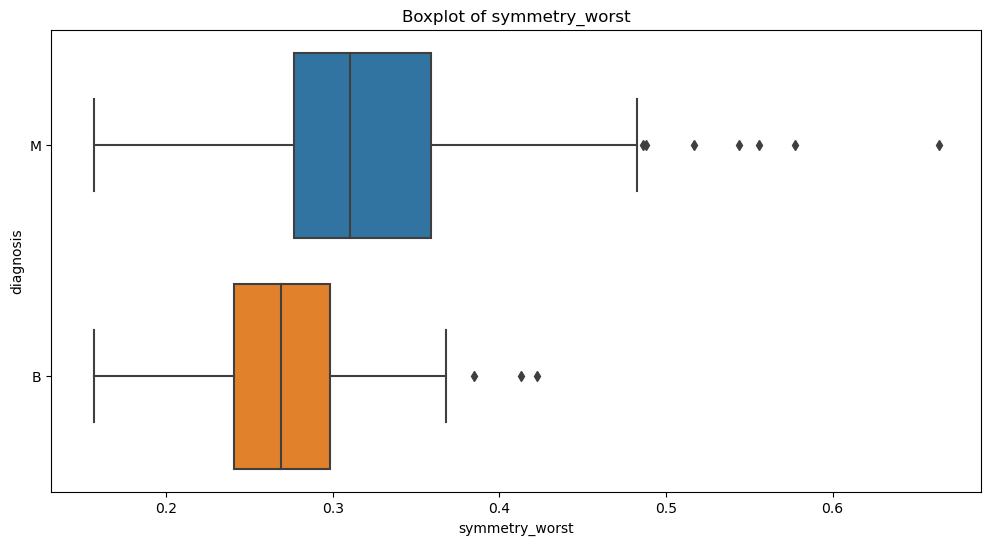

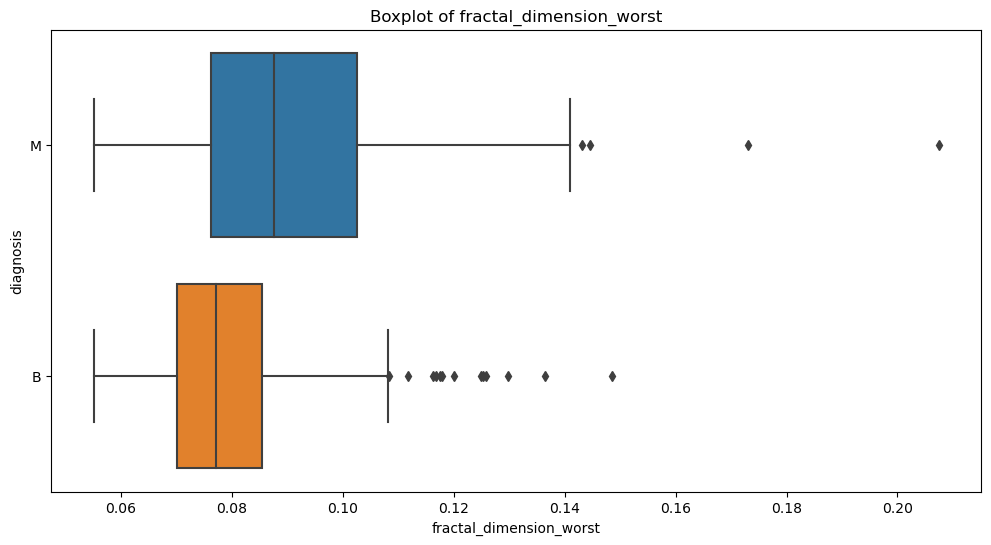

In [14]:
for col in numeric_features:
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=df, x=col, y=df['diagnosis'])
    plt.title(f'Boxplot of {col}')
    plt.show()

In [17]:
missing_percent = df.isnull().mean() * 100
missing_percent

diagnosis                  0.0
radius_mean                0.0
texture_mean               0.0
perimeter_mean             0.0
area_mean                  0.0
smoothness_mean            0.0
compactness_mean           0.0
concavity_mean             0.0
concave points_mean        0.0
symmetry_mean              0.0
fractal_dimension_mean     0.0
radius_se                  0.0
texture_se                 0.0
perimeter_se               0.0
area_se                    0.0
smoothness_se              0.0
compactness_se             0.0
concavity_se               0.0
concave points_se          0.0
symmetry_se                0.0
fractal_dimension_se       0.0
radius_worst               0.0
texture_worst              0.0
perimeter_worst            0.0
area_worst                 0.0
smoothness_worst           0.0
compactness_worst          0.0
concavity_worst            0.0
concave points_worst       0.0
symmetry_worst             0.0
fractal_dimension_worst    0.0
dtype: float64

In [28]:
df['diagnosis'] = df['diagnosis'].map({'M': 1, 'B': 0})

<AxesSubplot:>

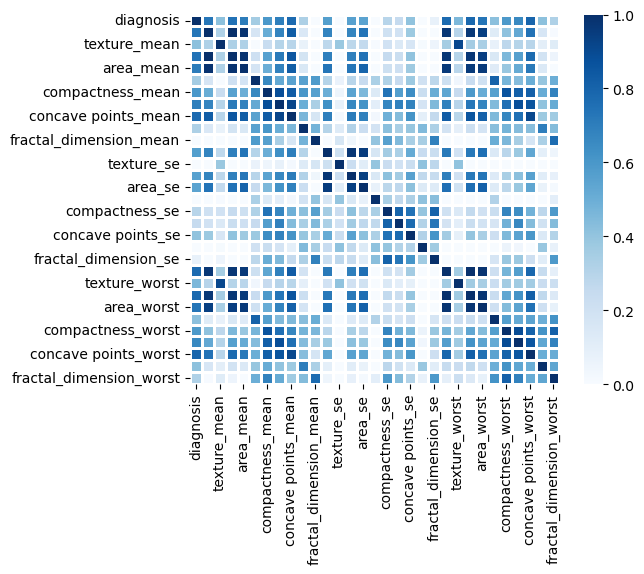

In [29]:
df_corr = df.corr()

sns.heatmap(df_corr, vmin=0, vmax=1, linewidths=2, square=True, cmap='Blues')


In [32]:
df_corr['diagnosis'].sort_values(ascending=False)

diagnosis                  1.000000
concave points_worst       0.793566
perimeter_worst            0.782914
concave points_mean        0.776614
radius_worst               0.776454
perimeter_mean             0.742636
area_worst                 0.733825
radius_mean                0.730029
area_mean                  0.708984
concavity_mean             0.696360
concavity_worst            0.659610
compactness_mean           0.596534
compactness_worst          0.590998
radius_se                  0.567134
perimeter_se               0.556141
area_se                    0.548236
texture_worst              0.456903
smoothness_worst           0.421465
symmetry_worst             0.416294
texture_mean               0.415185
concave points_se          0.408042
smoothness_mean            0.358560
symmetry_mean              0.330499
fractal_dimension_worst    0.323872
compactness_se             0.292999
concavity_se               0.253730
fractal_dimension_se       0.077972
symmetry_se               -0

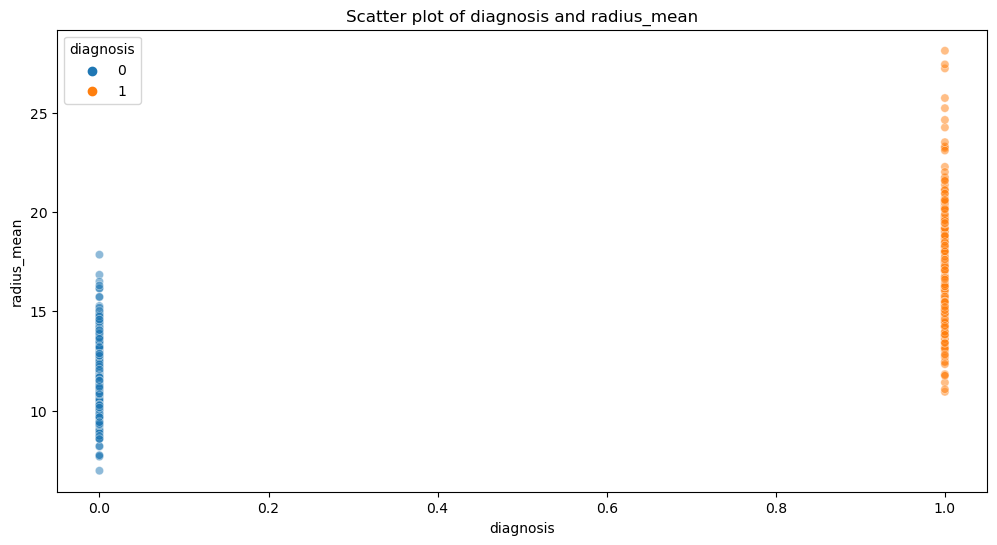

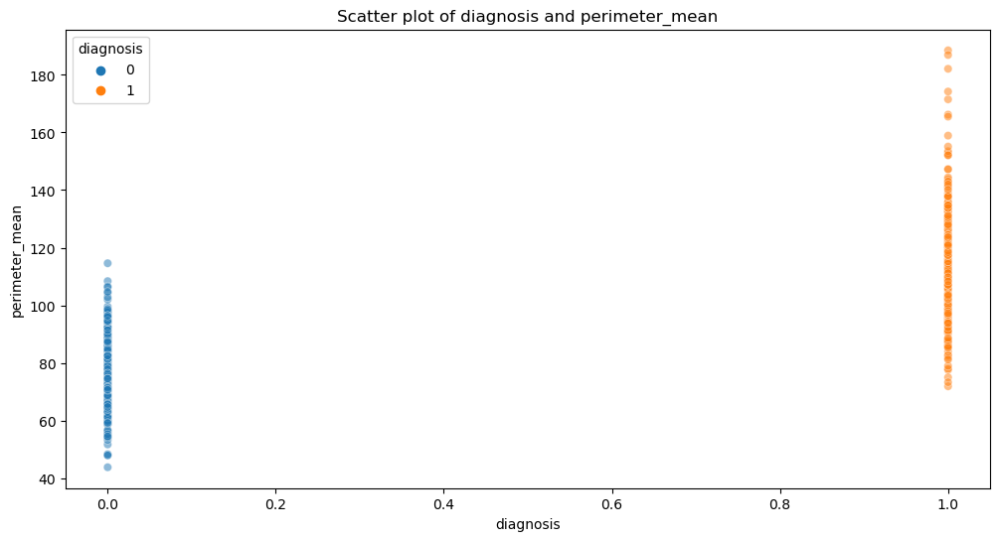

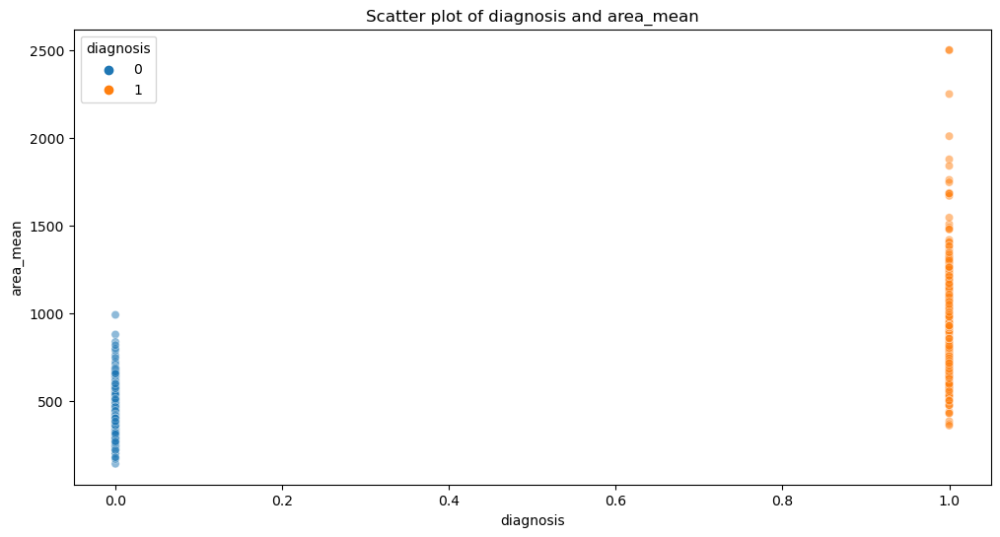

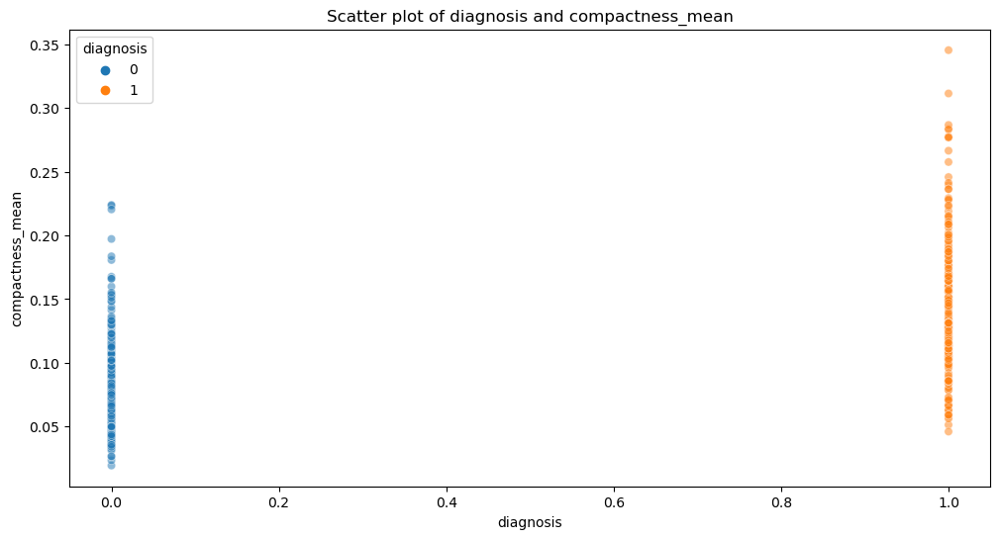

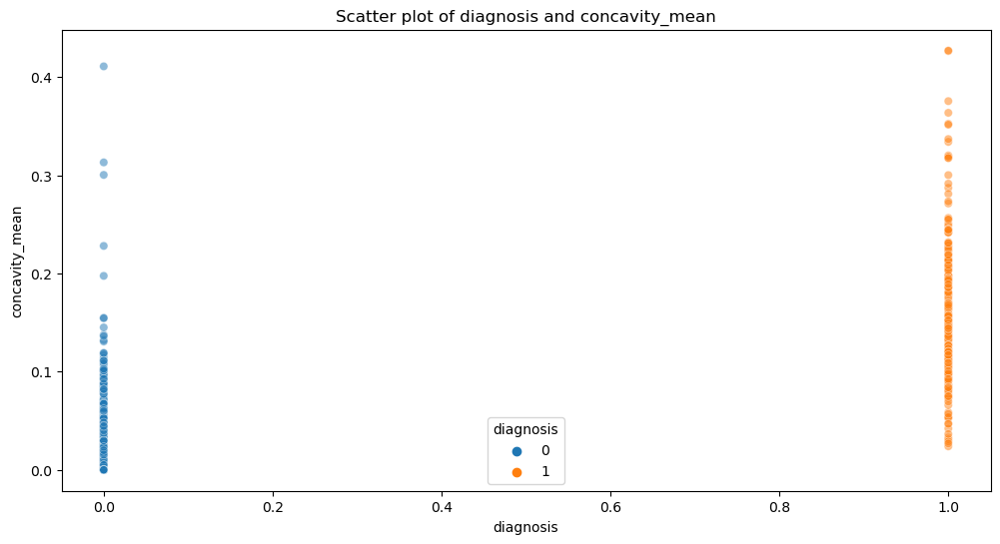

...

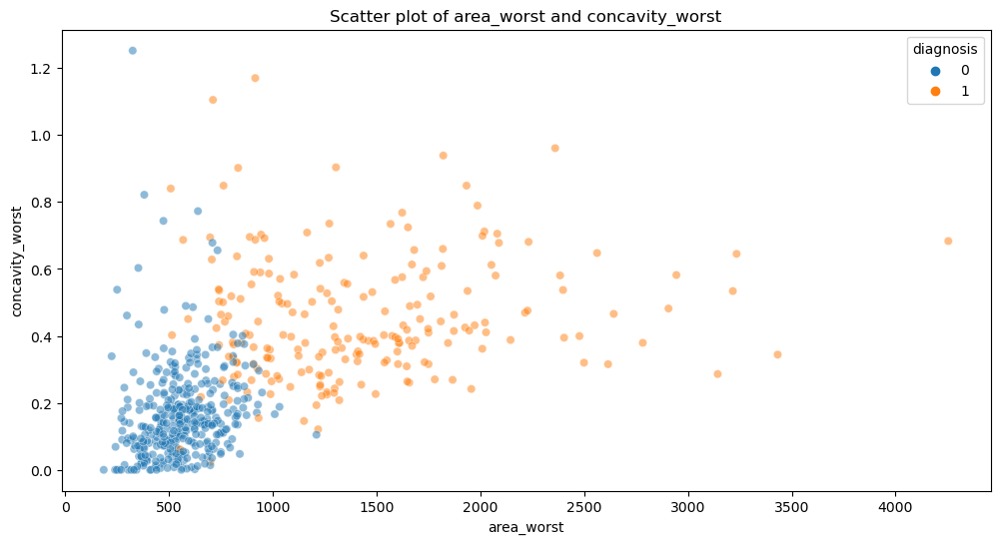

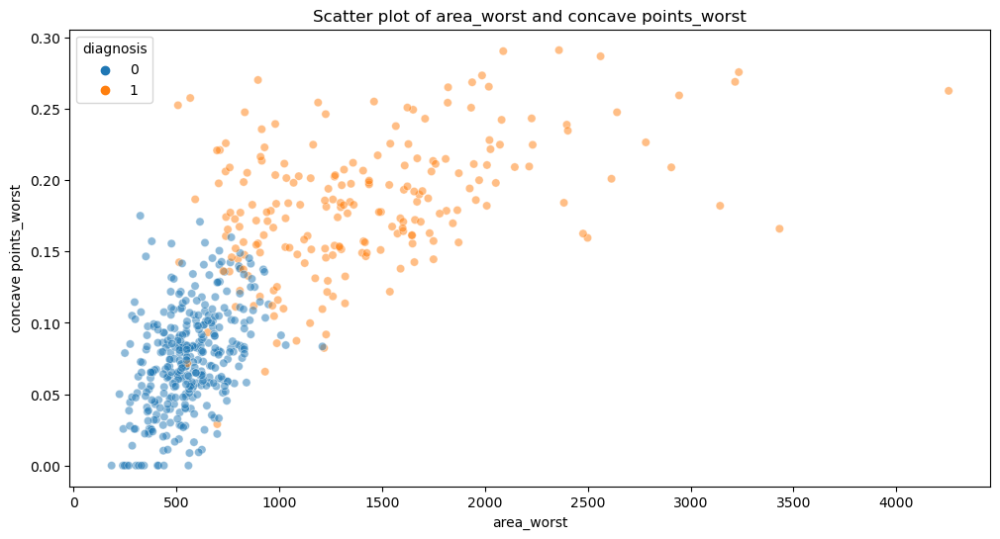

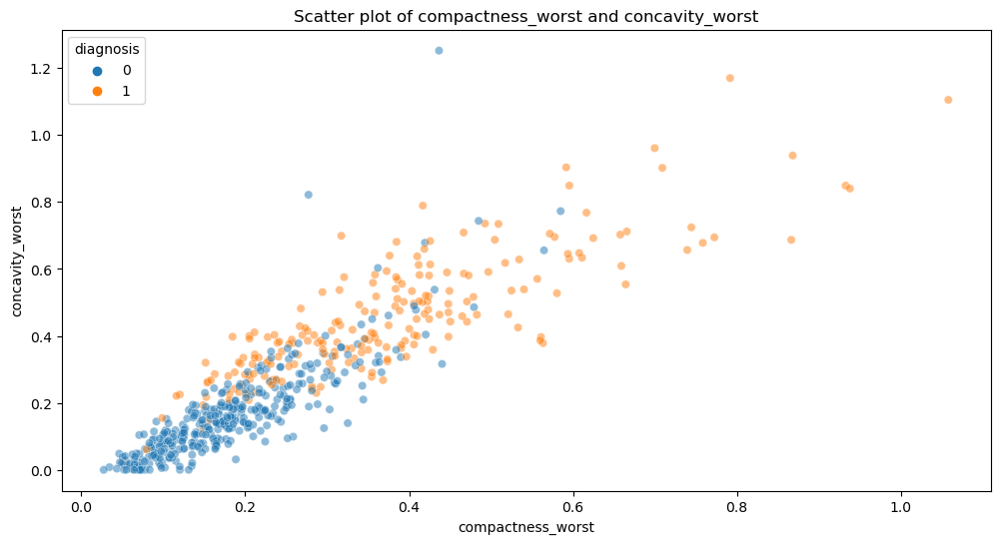

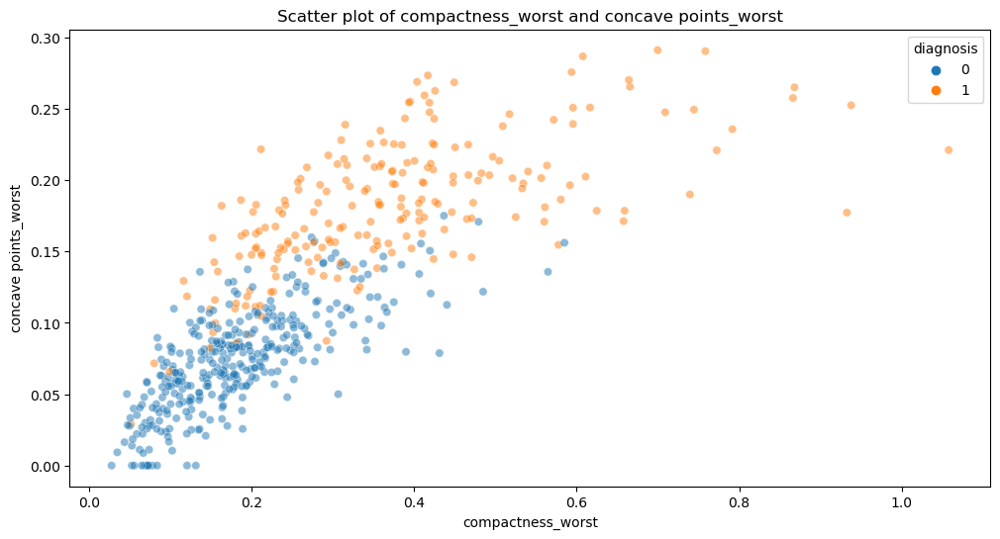

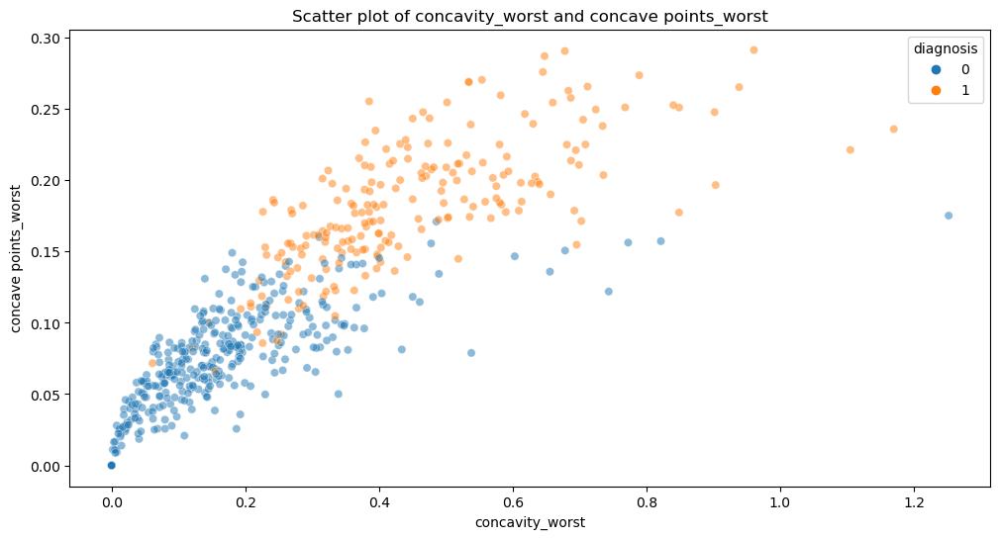

In [36]:
corr_cols = df_corr[df_corr['diagnosis'] > 0.5].index.tolist()

from itertools import combinations  

res = list(combinations(corr_cols, 2))
for col1, col2 in res:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(data=df, x=col1, y=col2, hue='diagnosis', alpha=0.5)
    plt.title(f'Scatter plot of {col1} and {col2}')
    plt.show()

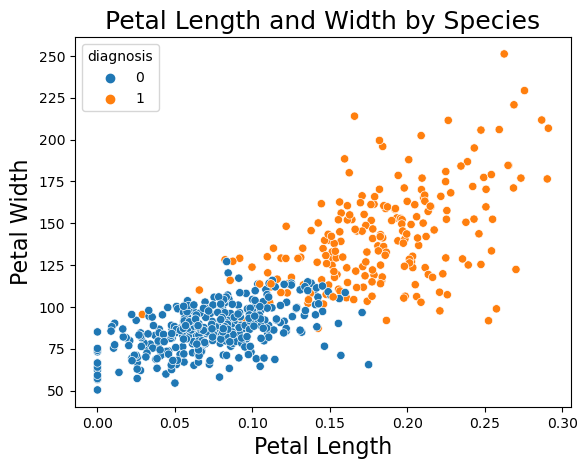

In [34]:
sns.scatterplot(x="concave points_worst", y="perimeter_worst", hue="diagnosis", data=df);
plt.title('Petal Length and Width by Species', fontsize=18);
plt.xlabel('Petal Length', fontsize=16);
plt.ylabel('Petal Width', fontsize=16);

## Model

In [ ]:
y = df['diagnosis']
X = df.drop(columns=['diagnosis'])

In [22]:
numerical_transformer = StandardScaler()

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numeric_features),
    ]   
)

lr = LogisticRegression(max_iter=1000)

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', lr)
])

In [24]:
cv_scores = []

kf = KFold(n_splits=5, shuffle=True, random_state=42)

for fold, (train_indicies, valid_indicies) in enumerate(kf.split(X)):
    
    print("-"*15, "Fold", fold, "-"*15)
    X_train, X_valid = X.iloc[train_indicies], X.iloc[valid_indicies]
    y_train, y_valid = y.iloc[train_indicies].values, y.iloc[valid_indicies].values 

    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_valid)
    score = recall_score(y_valid, y_pred)
    print("Score: ", score)
    cv_scores.append(score)

--------------- Fold 0 ---------------
Score:  0.9534883720930233
--------------- Fold 1 ---------------
Score:  1.0
--------------- Fold 2 ---------------
Score:  0.9302325581395349
--------------- Fold 3 ---------------
Score:  0.9767441860465116
--------------- Fold 4 ---------------
Score:  0.9565217391304348


In [26]:
np.mean(cv_scores), np.std(cv_scores)

(0.9633973710819008, 0.023508540178460033)